<a href="https://colab.research.google.com/github/gchn24/DS-Notes/blob/main/ANOVA_Sept22_Beg.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))
import matplotlib.pyplot as plt
import matplotlib_inline
matplotlib_inline.backend_inline.set_matplotlib_formats('svg')

In [ ]:
!gdown 1_2kBsNqufqogMjez4eItqnNgckSVHGF2 -O 'aerofit.csv'
!gdown 1V9ZFTiRKzJ8dbdD1JI5nRM1_TEVTRjGS -O 'weight-height.csv'
!gdown 1aq99JU9RTJbkLoMA-LrU42cmXsBwjERh -O 'waiting_time.csv'

Downloading...
From: https://drive.google.com/uc?id=1_2kBsNqufqogMjez4eItqnNgckSVHGF2
To: /content/aerofit.csv
100% 7.46k/7.46k [00:00<00:00, 29.1MB/s]
Downloading...
From: https://drive.google.com/uc?id=1V9ZFTiRKzJ8dbdD1JI5nRM1_TEVTRjGS
To: /content/weight-height.csv
100% 428k/428k [00:00<00:00, 72.5MB/s]
Downloading...
From: https://drive.google.com/uc?id=1aq99JU9RTJbkLoMA-LrU42cmXsBwjERh
To: /content/waiting_time.csv
100% 1.66M/1.66M [00:00<00:00, 176MB/s]


In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from scipy.stats import ttest_ind # Numeric Vs categorical



In [ ]:
from scipy.stats import f_oneway

# Aerofit

In [ ]:
df_aerofit = pd.read_csv("aerofit.csv")

In [ ]:
df_aerofit.head()

,Product,Age,Gender,Education,MaritalStatus,Usage,Fitness,Income,Miles
0,KP281,18,Male,14,Single,3,4,29562,112
1,KP281,19,Male,15,Single,2,3,31836,75
2,KP281,19,Female,14,Partnered,4,3,30699,66
3,KP281,19,Male,12,Single,3,3,32973,85
4,KP281,20,Male,13,Partnered,4,2,35247,47


In [ ]:
df_aerofit["Product"].unique()

array(['KP281', 'KP481', 'KP781'], dtype=object)

<Axes: xlabel='Product', ylabel='Income'>

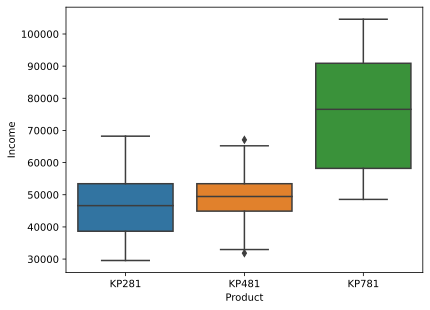

In [ ]:
sns.boxplot(x='Product', y='Income', data=df_aerofit)

In [ ]:
df_aerofit.sample(5)

,Product,Age,Gender,Education,MaritalStatus,Usage,Fitness,Income,Miles
113,KP481,30,Female,14,Single,3,3,57987,74
126,KP481,34,Male,16,Partnered,3,4,59124,85
141,KP781,22,Male,16,Single,3,5,54781,120
23,KP281,24,Female,16,Partnered,5,5,44343,188
58,KP281,32,Male,14,Partnered,4,3,52302,85


In [ ]:
len(df_aerofit)

180

In [ ]:
df_aerofit["random_group"] = np.random.choice(["g1","g2","g3"] , size = len(df_aerofit))


In [ ]:
df_aerofit.head()

,Product,Age,Gender,Education,MaritalStatus,Usage,Fitness,Income,Miles,random_group
0,KP281,18,Male,14,Single,3,4,29562,112,g2
1,KP281,19,Male,15,Single,2,3,31836,75,g2
2,KP281,19,Female,14,Partnered,4,3,30699,66,g3
3,KP281,19,Male,12,Single,3,3,32973,85,g2
4,KP281,20,Male,13,Partnered,4,2,35247,47,g3


In [ ]:
df_aerofit.random_group.value_counts()

g2    68
g3    65
g1    47
Name: random_group, dtype: int64

<Axes: xlabel='random_group', ylabel='Income'>

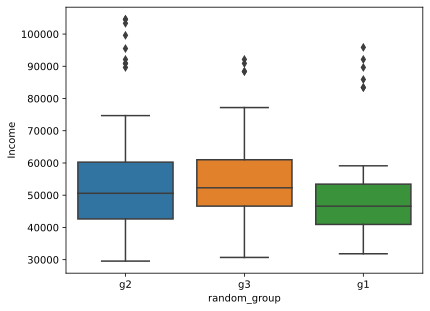

In [ ]:
sns.boxplot(x='random_group', y='Income', data=df_aerofit)

<Axes: xlabel='Income', ylabel='random_group'>

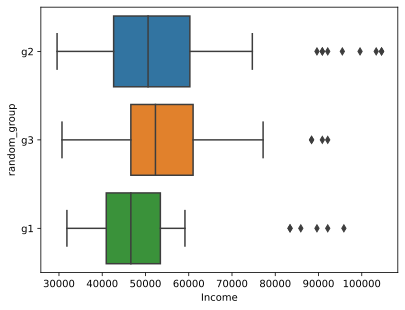

In [ ]:
sns.boxplot(y='random_group', x='Income', data=df_aerofit, orient="h")

<Axes: xlabel='Income', ylabel='Density'>

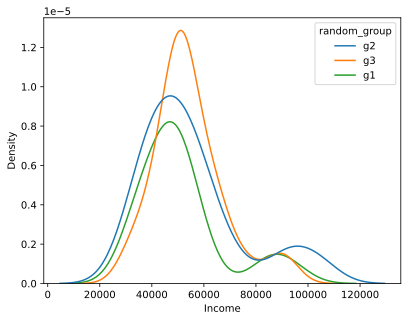

In [ ]:
sns.kdeplot(x="Income", data = df_aerofit, hue = "random_group")

In [ ]:
# df_aerofit.head()

In [ ]:
income_g1 = df_aerofit[df_aerofit["random_group"]=="g1"]["Income"]

income_g2 = df_aerofit[df_aerofit["random_group"]=="g2"]["Income"]

income_g3 = df_aerofit[df_aerofit["random_group"]=="g3"]["Income"]

In [ ]:
# income_g1.mean()

# income_g2.mean()

# income_g3.mean()

<Axes: xlabel='Income', ylabel='Density'>

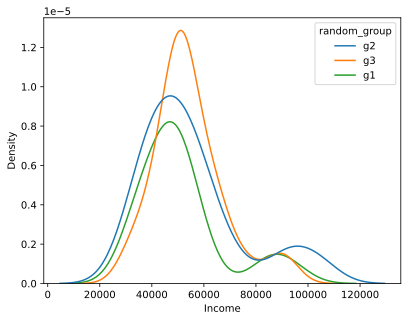

In [ ]:
sns.kdeplot(x="Income", data = df_aerofit, hue = "random_group")

In [ ]:
from scipy.stats import f_oneway, f

In [ ]:
# income_g1

In [ ]:
# H0: All groups have same mean
# Ha: One or more groups have different mean
f_stats, p_value = f_oneway(income_g1, income_g2, income_g3)

print("f_ratio : ", f_stats)

print("p_value : ", p_value)
if p_value < 0.05:
    print("Reject H0")
else:
    print("Fail to reject H0")
    print("All groups have same mean")

f_ratio :  0.7876982618698335
p_value :  0.4564786027863287
Fail to reject H0
All groups have same mean


<Axes: xlabel='Income', ylabel='Product'>

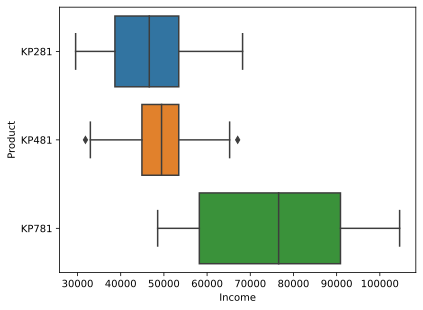

In [ ]:
sns.boxplot(y='Product', x='Income', data=df_aerofit, orient="h")

<Axes: xlabel='Income', ylabel='Density'>

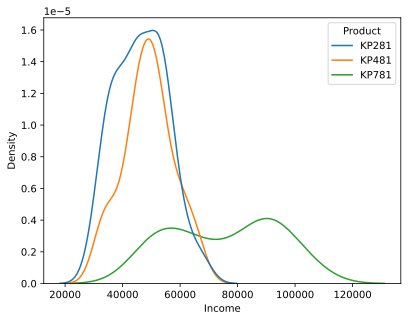

In [ ]:
sns.kdeplot(x="Income", data = df_aerofit, hue = "Product")

In [ ]:
income_kp281 = df_aerofit[df_aerofit["Product"]=="KP281"]["Income"]
income_kp481 = df_aerofit[df_aerofit["Product"]=="KP481"]["Income"]
income_kp781 = df_aerofit[df_aerofit["Product"]=="KP781"]["Income"]

In [ ]:
# H0: All groups have same mean
# Ha: One or more groups have different mean

f_stats, p_value = f_oneway(income_kp281, income_kp481, income_kp781)

print("f_ratio : ", f_stats)

print("p_value : ", p_value)

if p_value < 0.05:
    print("Reject H0")
else:
    print("Fail to reject H0")
    print("All groups have same mean")

f_ratio :  89.25903546601671
p_value :  1.5644991316342494e-27
Reject H0


In [ ]:
df_aerofit.head()

,Product,Age,Gender,Education,MaritalStatus,Usage,Fitness,Income,Miles,random_group
0,KP281,18,Male,14,Single,3,4,29562,112,g2
1,KP281,19,Male,15,Single,2,3,31836,75,g2
2,KP281,19,Female,14,Partnered,4,3,30699,66,g3
3,KP281,19,Male,12,Single,3,3,32973,85,g2
4,KP281,20,Male,13,Partnered,4,2,35247,47,g3


# Assumptions of ANOVA

In [ ]:
# 1. Gaussian

# 2. Independent

# 3. Equal variance

### 1. Gaussian

In [ ]:
df_hw = pd.read_csv("weight-height.csv")

In [ ]:
df_hw.head()

,Gender,Height,Weight
0,Male,73.847017,241.893563
1,Male,68.781904,162.310473
2,Male,74.110105,212.740856
3,Male,71.730978,220.042470
4,Male,69.881796,206.349801


In [ ]:
## QQ plot
## HT : Shapiro (H0 : data is normal, HA : Data is not normal, if p_value < alpha)

#### QQ plot

In [ ]:
from statsmodels.graphics.gofplots import qqplot

In [ ]:
height = df_hw["Height"]

<Axes: xlabel='Height', ylabel='Count'>

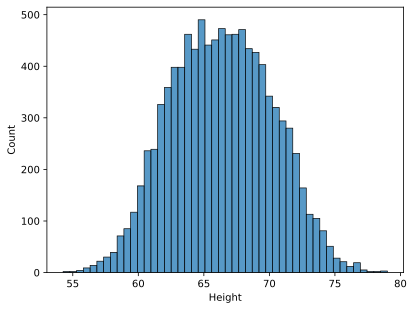

In [ ]:
sns.histplot(height)

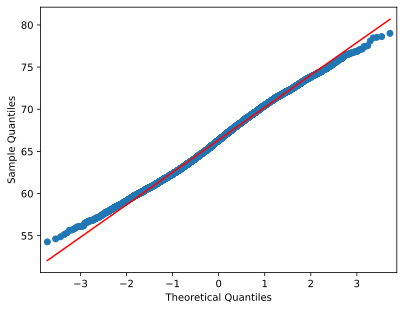

In [ ]:
qqplot(height, line = "s")
plt.show()

In [ ]:
df_wt = pd.read_csv("waiting_time.csv")

In [ ]:
df_wt

,time
0,184.003075
1,36.721521
2,29.970417
3,75.640285
4,61.489439
...,...
90041,135.885984
90042,15.223970
90043,207.839528
90044,140.488418


<Axes: xlabel='time', ylabel='Count'>

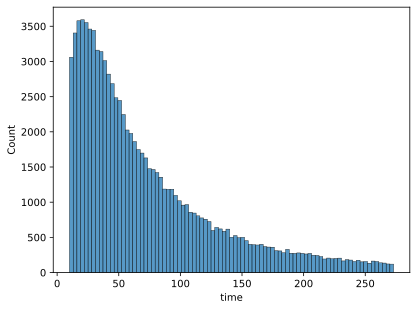

In [ ]:
sns.histplot(df_wt["time"])

In [ ]:
qqplot(df_wt["time"], line="s")
plt.show()

## Shapiro test for Gaussian


In [ ]:
## ideal sample size is 50-200

height_subset = height.sample(100)



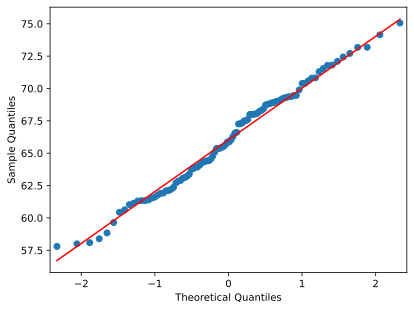

In [ ]:
qqplot(height_subset, line = "s")
plt.show()

In [ ]:
from scipy.stats import shapiro

In [ ]:
# H0: Data is Gaussian
# Ha: Data is not Gaussian

test_stat, p_value = shapiro(height_subset)
print(p_value)


0.25859811902046204


#### Variance :

<Axes: xlabel='Height', ylabel='Count'>

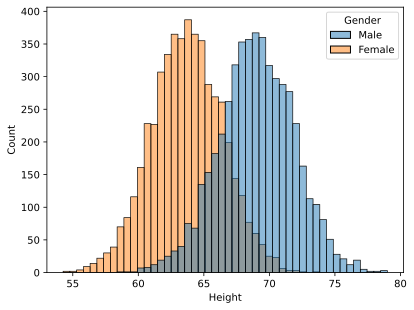

In [ ]:
sns.histplot(data = df_hw, x = "Height", hue = "Gender")

In [ ]:
height_men = df_hw[df_hw["Gender"]=="Male"]["Height"]
height_women = df_hw[df_hw["Gender"]=="Female"]["Height"]

In [ ]:
from scipy.stats import levene

In [ ]:
# H0: Variances are equal
# Ha: Variances are not equal

levene_stat, p_value = levene(height_men, height_women)
print(p_value)
if p_value < 0.05:
    print("Variances are not equal")


0.0004586349895436178
Variances are not equal


# Optional Post read - ANOVA implementation

In [ ]:
a = [25, 25, 27, 30, 23, 20]
b = [30, 30, 21, 24, 26, 28]
c = [18, 30, 29, 29, 24, 26]

In [ ]:
f_stat, p_value = f_oneway(a,b,c)
print(f_stat, p_value) ## same sales weekly mean

0.2348993288590604 0.793504662732833


In [ ]:
from scipy.stats import kruskal

In [ ]:
# If assumptions of ANOVA don't hold, we need Kruskal Wallis
kruskal(a, b, c) ## same sales weekly mean

KruskalResult(statistic=0.6794066317626576, pvalue=0.7119815250421468)

In [ ]:
list_of_tuples = list(zip(a, b,c))
df = pd.DataFrame(list_of_tuples, columns = ['A', 'B', 'C'])
df

,A,B,C
0,25,30,18
1,25,30,30
2,27,21,29
3,30,24,29
4,23,26,24
5,20,28,26


In [ ]:
m1 = np.mean(a)
m2 = np.mean(b)
m3 = np.mean(c)

print('Average sales for A: {}'.format(m1))
print('Average sales for B: {}'.format(m2))
print('Average sales for C: {}'.format(m3))

Average sales for A: 25.0
Average sales for B: 26.5
Average sales for C: 26.0


In [ ]:
m = (m1+m2+m3)/3
print('Overall mean: {}'.format(m))

Overall mean: 25.833333333333332


In [ ]:
SSb = 6*((m1-m)**2+(m2-m)**2+(m3-m)**2)
print('Between-groups Sum of Squared Differences: {}'.format(SSb))

Between-groups Sum of Squared Differences: 6.999999999999999


In [ ]:
MSb = SSb/2
print('Between-groups Mean Square value: {}'.format(MSb))

Between-groups Mean Square value: 3.4999999999999996


In [ ]:
err_a = list(a-m1)
err_b = list(b-m2)
err_c = list(c-m3)
err = err_a+err_b+err_c
ssw = []
for i in err:
    ssw.append(i**2)

SSw = np.sum(ssw)

In [ ]:
MSw = SSw/15
print('Within-group Mean Square value: {}'.format(MSw))

Within-group Mean Square value: 14.9


In [ ]:
F = MSb/MSw
print('F-score: {}'.format(F))

F-score: 0.23489932885906037


In [ ]:
1 - f.cdf(F, dfn=2, dfd=15)

0.7935046627328333

In [ ]:
f_stat, p_value = f_oneway(a,b,c)
print(f_stat, p_value)

0.2348993288590604 0.793504662732833


In [ ]:
# If assumptions of ANOVA don't hold, we need Kruskal Wallis
kruskal(a, b, c)

KruskalResult(statistic=0.6794066317626576, pvalue=0.7119815250421468)

In [ ]:
#Q1

# H0: All region have same mean energy consumption
# Ha: One or more region have different mean

a = [13, 8, 11, 12, 11]
b = [15, 10, 16, 11, 13, 10]
c = [5, 11, 9, 5]
d = [8, 10, 6, 5, 7]

f_stats, p_value = f_oneway(a, b, c,d)

print("f_ratio : ", f_stats)

print("p_value : ", p_value)
if p_value < 0.05:
    print("Reject H0")
else:
    print("Fail to reject H0")
    print("All groups have same mean")

f_ratio :  6.324748040313554
p_value :  0.0049302919205628576
Reject H0


In [ ]:
#Q2

one_star = [382, 391, 335, 368, 400, 372]
two_star = [560, 343, 512, 329, 391, 367]
three_star = [384, 458, 409, 309, 374, 459]
four_star = [325, 390, 304, 240, 306, 169]
five_star = [360, 298, 272, 368, 320, 326]


# H0: All books have same mean pages
# Ha: One or more books have different mean

f_stats, p_value = f_oneway(one_star,two_star,three_star,four_star,five_star)

print("f_ratio : ", f_stats)

print("p_value : ", p_value)
if p_value < 0.01:
    print("Reject H0")
else:
    print("Fail to reject H0")
    print("All groups have same mean")

f_ratio :  4.238644902556343
p_value :  0.009362001936328837
Reject H0


In [ ]:
#Q3

Brand_A = [19.60, 18.82, 19.00, 18.45, 19.79, 19.03, 17.89, 19.42]
Brand_B = [21.10, 20.00, 20.43, 19.67, 18.99, 19.98, 20.14, 19.78]
Brand_C = [10.31, 10.02, 9.41, 9.89, 10.05, 10.52, 11.02, 10.42]
Brand_D = [17.02, 16.71, 17.78, 18.65, 15.98, 17.63, 17.00, 16.78, 16.92, 17.14]

# H0: All phones have same mean battery life
# Ha: One or more phones have different mean

f_stats, p_value = f_oneway(Brand_A,Brand_B,Brand_C,Brand_D)

print("f_ratio : ", f_stats)

print("p_value : ", p_value)
if p_value < 0.05:
    print("Reject H0")
else:
    print("Fail to reject H0")
    print("All groups have same mean")

f_ratio :  404.7865500650496
p_value :  2.392149441499325e-24
Reject H0


In [ ]:
#Q4

cars = [19.9, 15.3, 2.2, 6.8, 34.2, 8.3, 12.0, 7.0, 9.5, 1.1]
buses = [1.8, 24.6, 7.2, 37.0, 7.2, 21.2, 6.5, 23.6]
trucks = [13.3, 23.0, 25.4, 15.3, 57.1, 14.5, 26.0]

# H0: All vehicles have same mean miles
# Ha: One or more vehicle have different mean

f_stats, p_value = f_oneway(cars,buses,trucks)

print("f_ratio : ", f_stats)

print("p_value : ", p_value)
if p_value < 0.07:
    print("Reject H0")
else:
    print("Fail to reject H0")
    print("All groups have same mean")

f_ratio :  2.4686944536875277
p_value :  0.10782985675757563
Fail to reject H0
All groups have same mean


In [ ]:
#Q5

college_students = [71, 62, 63, 59, 67, 68, 63, 62, 66, 65, 61, 60]
athletes = [67, 68, 72, 66, 65, 69, 71, 70, 65, 64, 68]
army = [68, 67, 66, 68, 69, 70, 71, 69, 66, 67]

# H0: All groups have same mean heights
# Ha: One or more group have different mean

f_stats, p_value = f_oneway(college_students, athletes, army)

print("f_ratio : ", f_stats)

print("p_value : ", p_value)
if p_value < 0.01:
    print("Reject H0")
else:
    print("Fail to reject H0")
    print("All groups have same mean")

f_ratio :  7.899836075209478
p_value :  0.0017534092082519943
Reject H0


In [ ]:
#Q7 day 122

# H0: All region have same mean energy consumption
# Ha: One or more region have different mean

a = [85,74,63.5,69.4,71.6,65,90,78]
b = [82,71,64,65.2,67.8,64.7,95,77]

f_stats, p_value = f_oneway(a, b)

print("f_ratio : ", f_stats)

print("p_value : ", p_value)
if p_value < 0.05:
    print("Reject H0")
else:
    print("Fail to reject H0")
    print("All groups have same mean")

f_ratio :  0.05874529665378649
p_value :  0.8120047862652722
Fail to reject H0
All groups have same mean
